# EDA - Sobel / Image Thresolding 

In [1]:
import os
import sys
import random

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import cv2 

from sklearn.model_selection import train_test_split

from itertools import chain
from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label

from keras.models import Model, load_model
from keras.layers import Input,Dropout,BatchNormalization,Activation
from keras.layers.core import Lambda
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import concatenate
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras import backend as K

import tensorflow as tf

from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

Using TensorFlow backend.
/Users/gino/miniconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)


In [2]:
basicpath = 'data/'
path_train = basicpath + 'train/'
path_test = basicpath + 'test/'
path_train_images = path_train + 'images/'
path_train_masks = path_train + 'masks/'
path_test_images = path_test + 'images/'

imgs = os.listdir(path_train_images)
ids = [i.replace('.png','') for i in imgs ]
ids 

['0530b67189',
 '1306fcee4c',
 '158765ed16',
 '16207869ba',
 '30082e87d9',
 '44d745a704',
 '48d81e93d9',
 '633c7d5c80',
 '711c478c93',
 '7e7276d088',
 '8329ec9395',
 '84e23dba29',
 '917ef84e64',
 '919bc0e2ba',
 '9cbd5ddba4',
 'a7cfa30d35',
 'ac931ace49',
 'c7f54785b8',
 'caa039b231',
 'cb36193e2f',
 'e73532b450',
 'e8d8b35601',
 'edf1e6ac00',
 'f139be21a4',
 'fb44090bc7']

## Raw Images 

/Users/gino/miniconda3/lib/python3.6/site-packages/keras_preprocessing/image.py:489: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn('grayscale is deprecated. Please use '
/Users/gino/miniconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


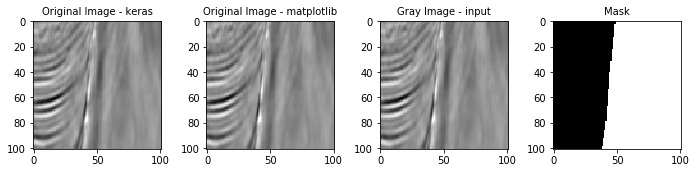

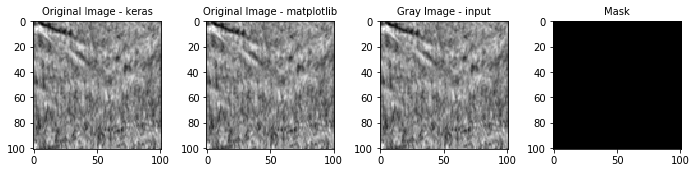

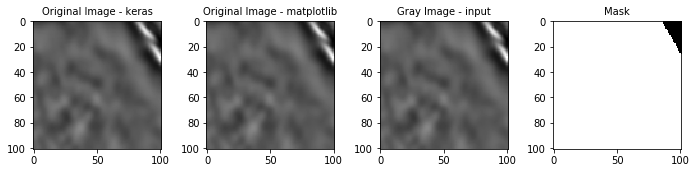

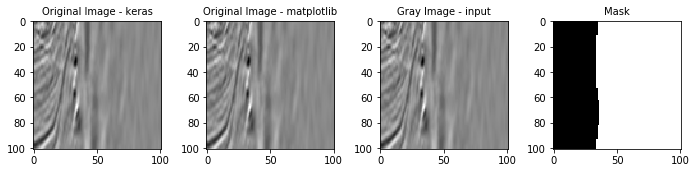

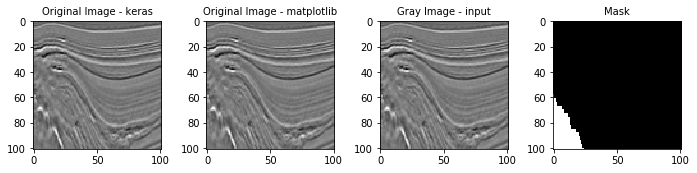

...

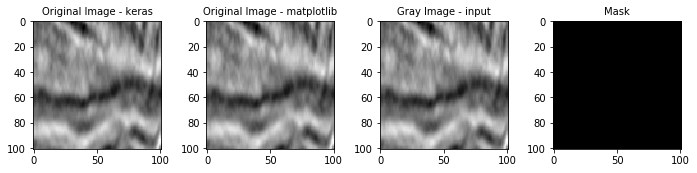

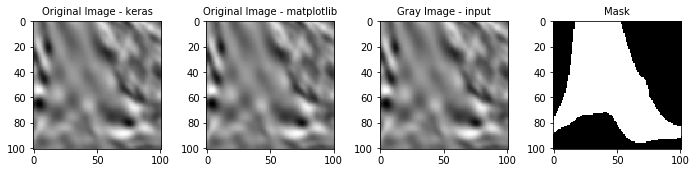

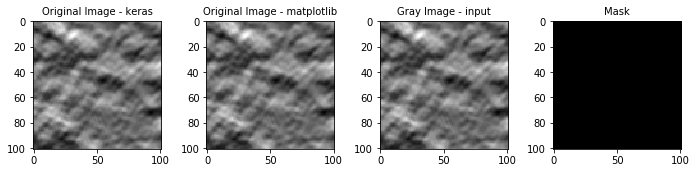

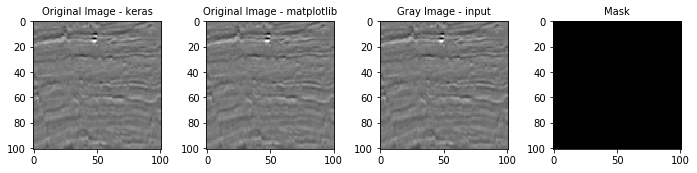

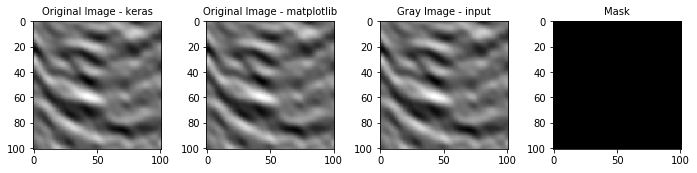

In [3]:
for _id in ids:
    image_gay = np.array(load_img(path_train_images+_id+".png",grayscale=True))/255
    mask = load_img(path_train_masks+_id+".png",grayscale=True)
    image_keras = load_img(path_train_images+_id+".png")
    image_matplotlib = imread(path_train_images+_id+".png")
    
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(image_keras)
    ax1.set_title('Original Image - keras', fontsize=10)
    ax2.imshow(image_matplotlib , cmap='gray')
    ax2.set_title('Original Image - matplotlib', fontsize=10)
    ax3.imshow(image_gay , cmap='gray')
    ax3.set_title('Gray Image - input', fontsize=10)
    ax4.imshow(mask , cmap='gray')
    ax4.set_title('Mask', fontsize=10)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

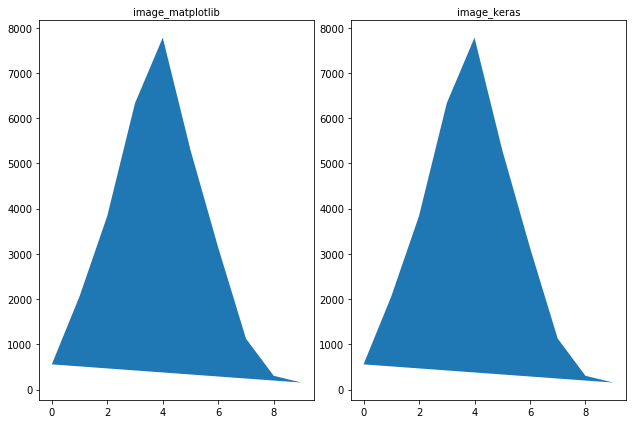

In [4]:
hist, bins  = np.histogram(image_matplotlib)
hist_k, bins_k  = np.histogram(image_keras)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 6))

f.tight_layout()
ax1.fill(hist)
ax1.set_title('image_matplotlib', fontsize=10)

f.tight_layout()
ax2.fill(hist_k)
ax2.set_title('image_keras', fontsize=10)

plt.show()

### Dimensions 

In [5]:
img = mpimg.imread(path_train_images+"1306fcee4c.png")
type(img) , img.shape

(numpy.ndarray, (101, 101, 3))

In [6]:
mask = mpimg.imread(path_train_masks+"1306fcee4c.png")
mask
type(mask) , mask.shape 

(numpy.ndarray, (101, 101))

### Computing gradients using Sobel operator

/Users/gino/miniconda3/lib/python3.6/site-packages/keras_preprocessing/image.py:489: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn('grayscale is deprecated. Please use '
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input d

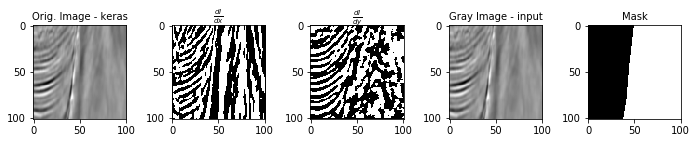

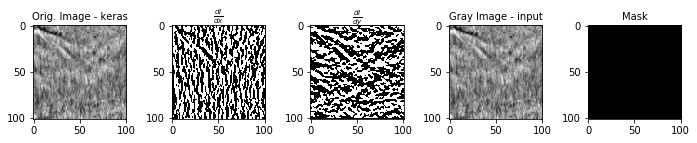

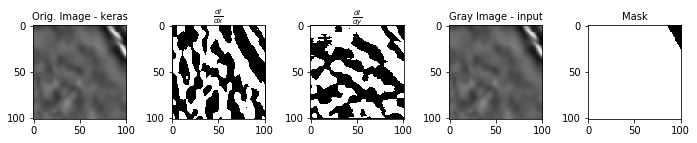

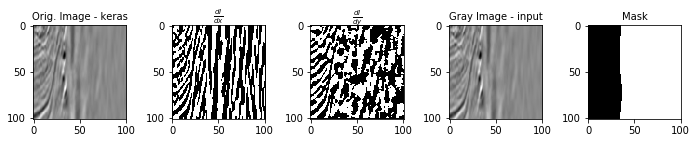

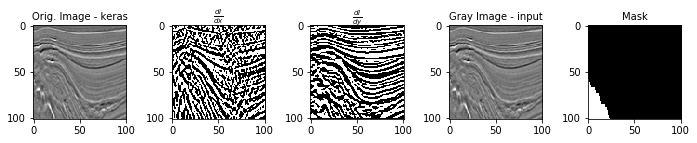

...

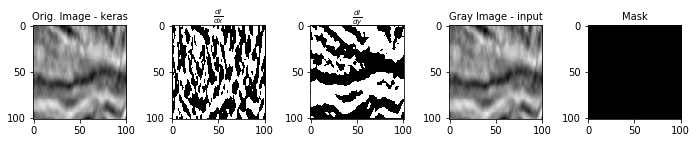

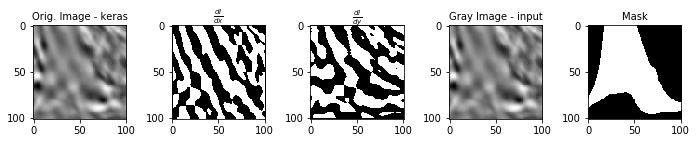

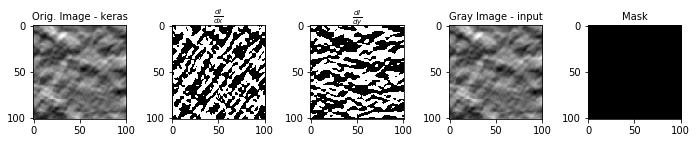

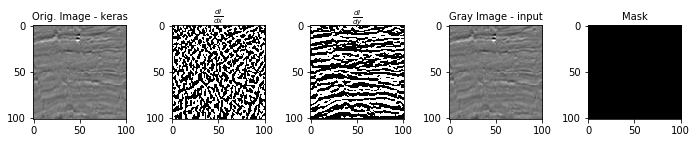

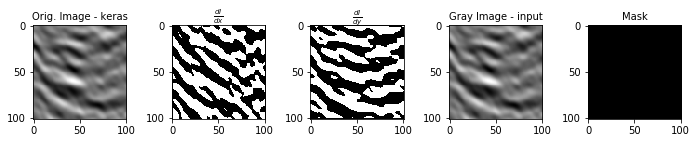

In [7]:
for _id in ids:
    image_gray = np.array(load_img(path_train_images+_id+".png",grayscale=True))/255
    mask = load_img(path_train_masks+_id+".png",grayscale=True)
    image_keras = load_img(path_train_images+_id+".png")
    image_matplotlib = imread(path_train_images+_id+".png")
    dx = cv2.Sobel(np.array(image_keras), cv2.CV_64F, 1, 0)
    dy = cv2.Sobel(np.array(image_keras), cv2.CV_64F, 0, 1)
    
    f, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(image_keras)
    ax1.set_title('Orig. Image - keras', fontsize=10)
    ax2.imshow(dx)
    ax2.set_title(r'$\frac{dI}{dx}$', fontsize=10)
    ax3.imshow(dy)
    ax3.set_title(r'$\frac{dI}{dy}$', fontsize=10)
    ax4.imshow(image_gray , cmap='gray')
    ax4.set_title('Gray Image - input', fontsize=10)
    ax5.imshow(mask , cmap='gray')
    ax5.set_title('Mask', fontsize=10)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### abs_sobel_thresh

/Users/gino/miniconda3/lib/python3.6/site-packages/keras_preprocessing/image.py:489: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn('grayscale is deprecated. Please use '
/Users/gino/miniconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


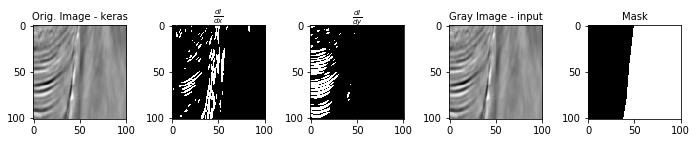

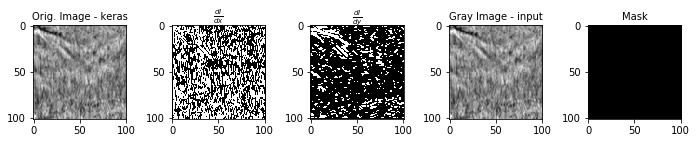

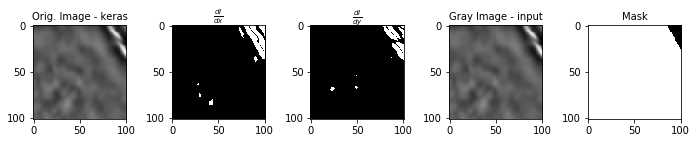

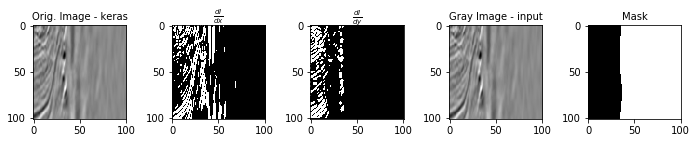

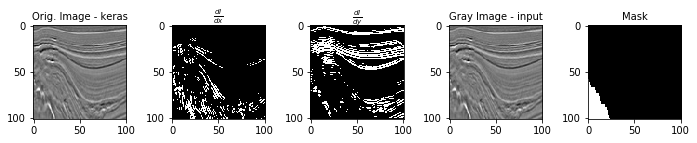

...

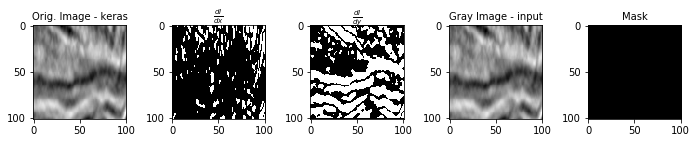

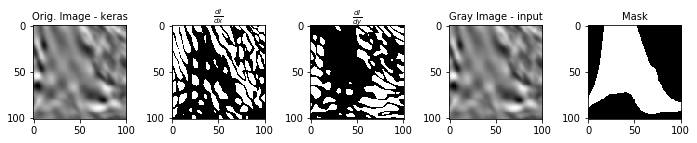

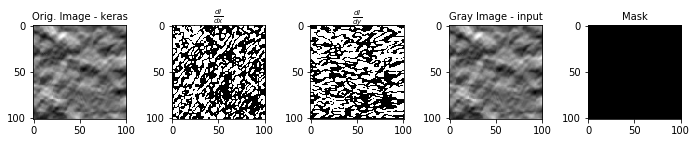

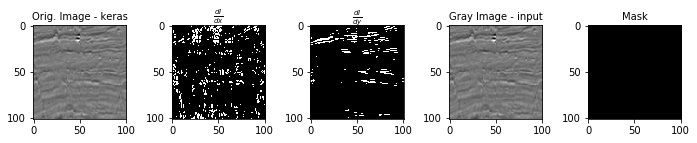

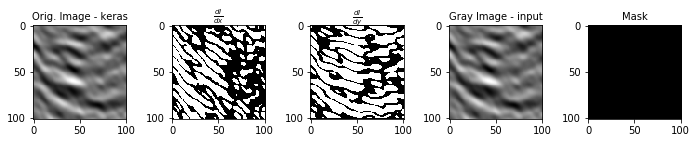

In [8]:
def abs_sobel_thresh(img, orient='x', thresh_min=150, thresh_max=255):
    img = np.array(img)
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output


for _id in ids:
    image_gray = np.array(load_img(path_train_images+_id+".png",grayscale=True))/255
    mask = load_img(path_train_masks+_id+".png",grayscale=True)
    image_keras = load_img(path_train_images+_id+".png")
    #image_matplotlib = imread(path_train_images+_id+".png")
    dx = abs_sobel_thresh(image_keras,orient='x', thresh_min=40, thresh_max=300)
    dy = abs_sobel_thresh(image_keras,orient='y', thresh_min=40, thresh_max=300)
    
    f, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(image_keras)
    ax1.set_title('Orig. Image - keras', fontsize=10)
    ax2.imshow(dx, cmap='gray')
    ax2.set_title(r'$\frac{dI}{dx}$', fontsize=10)
    ax3.imshow(dy, cmap='gray')
    ax3.set_title(r'$\frac{dI}{dy}$', fontsize=10)
    ax4.imshow(image_gray , cmap='gray')
    ax4.set_title('Gray Image - input', fontsize=10)
    ax5.imshow(mask , cmap='gray')
    ax5.set_title('Mask', fontsize=10)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### pipeline_default

/Users/gino/miniconda3/lib/python3.6/site-packages/keras_preprocessing/image.py:489: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn('grayscale is deprecated. Please use '
/Users/gino/miniconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


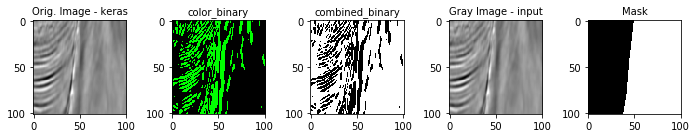

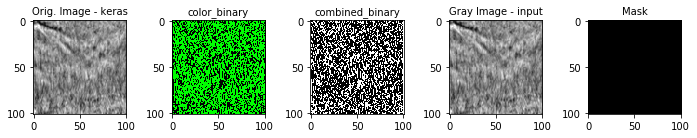

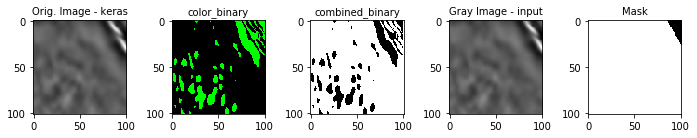

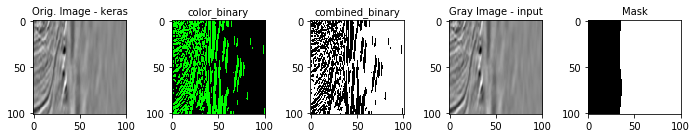

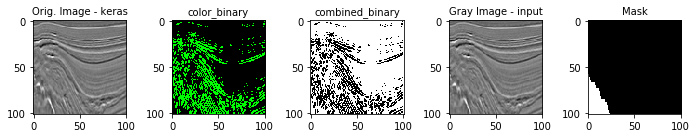

...

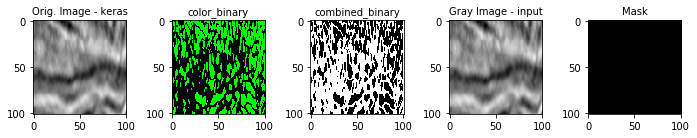

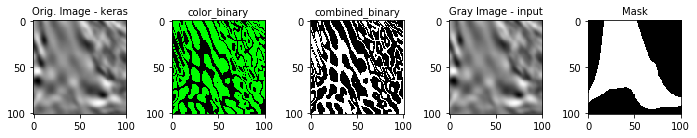

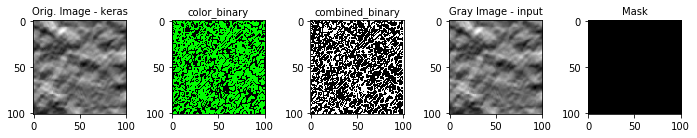

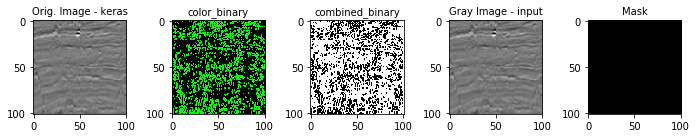

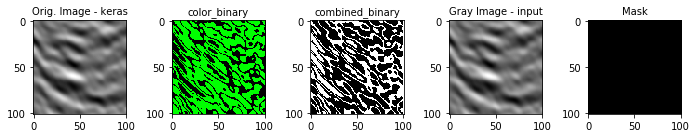

In [9]:
# Default pipeline.
def pipeline_default(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

    return color_binary , combined_binary


for _id in ids:
    image_gray = np.array(load_img(path_train_images+_id+".png",grayscale=True))/255
    mask = load_img(path_train_masks+_id+".png",grayscale=True)
    image_keras = load_img(path_train_images+_id+".png")
    #image_matplotlib = imread(path_train_images+_id+".png")
    color_binary , combined_binary = pipeline_default(np.array(image_keras))
    
    f, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(image_keras)
    ax1.set_title('Orig. Image - keras', fontsize=10)
    ax2.imshow(color_binary, cmap='gray')
    ax2.set_title('color_binary', fontsize=10)
    ax3.imshow(~combined_binary, cmap='gray')
    ax3.set_title('combined_binary', fontsize=10)
    ax4.imshow(image_gray , cmap='gray')
    ax4.set_title('Gray Image - input', fontsize=10)
    ax5.imshow(mask , cmap='gray')
    ax5.set_title('Mask', fontsize=10)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### mag_thresh

/Users/gino/miniconda3/lib/python3.6/site-packages/keras_preprocessing/image.py:489: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn('grayscale is deprecated. Please use '
/Users/gino/miniconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


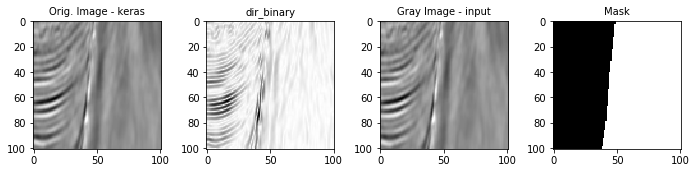

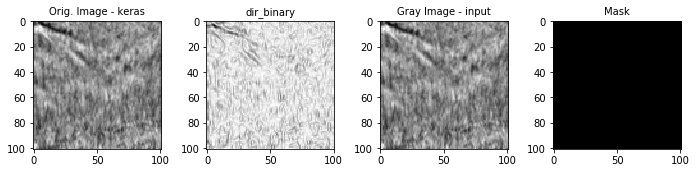

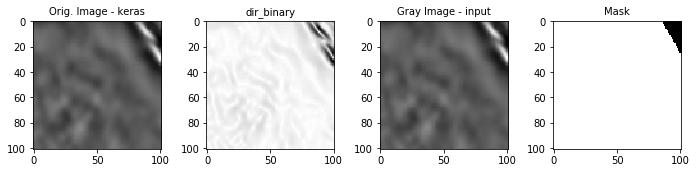

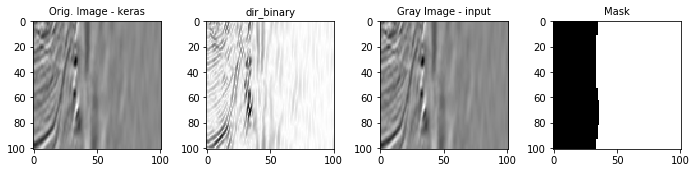

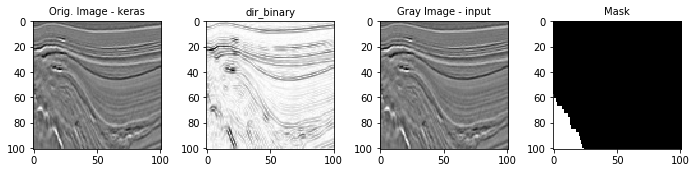

...

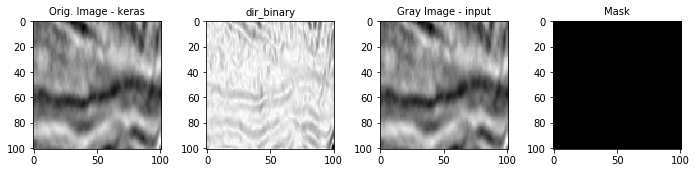

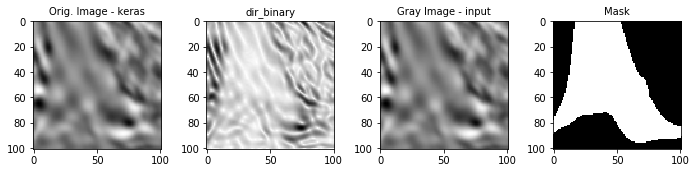

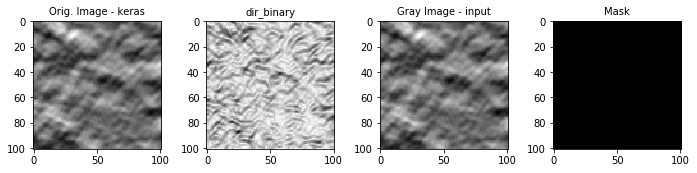

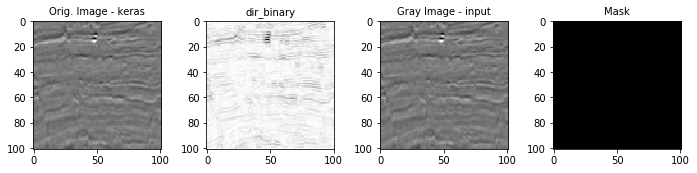

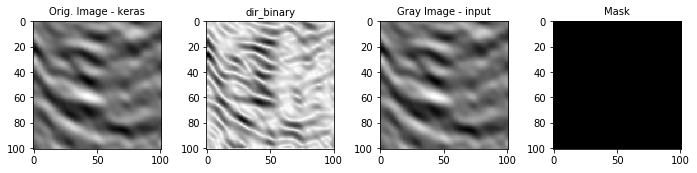

In [24]:
def gradmag(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    return ~gradmag

for _id in ids:
    image_gray = np.array(load_img(path_train_images+_id+".png",grayscale=True))/255
    mask = load_img(path_train_masks+_id+".png",grayscale=True)
    image_keras = load_img(path_train_images+_id+".png")
    image_matplotlib = imread(path_train_images+_id+".png")
    dir_binary = gradmag(np.array(image_matplotlib))
    
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(image_keras)
    ax1.set_title('Orig. Image - keras', fontsize=10)
    ax2.imshow(dir_binary , cmap='gray')
    ax2.set_title('dir_binary', fontsize=10)
    ax3.imshow(image_gray , cmap='gray')
    ax3.set_title('Gray Image - input', fontsize=10)
    ax4.imshow(mask , cmap='gray')
    ax4.set_title('Mask', fontsize=10)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


In [17]:
dir_binary.shape

(101, 101)

### dir_threshold

/Users/gino/miniconda3/lib/python3.6/site-packages/keras_preprocessing/image.py:489: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn('grayscale is deprecated. Please use '
/Users/gino/miniconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


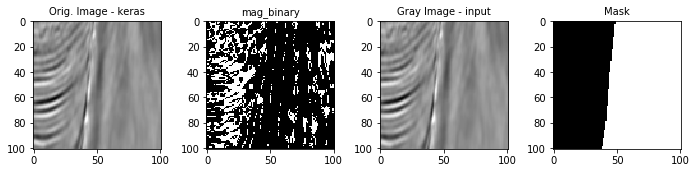

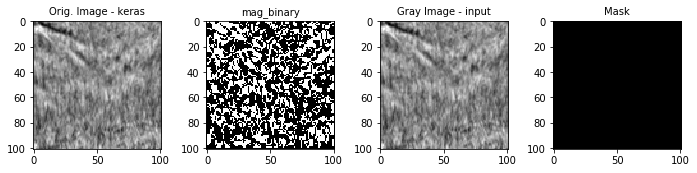

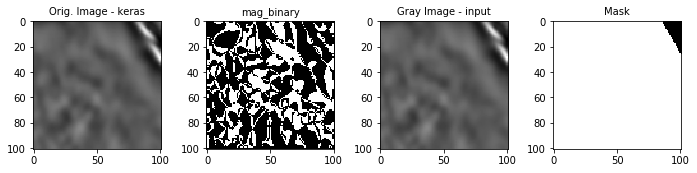

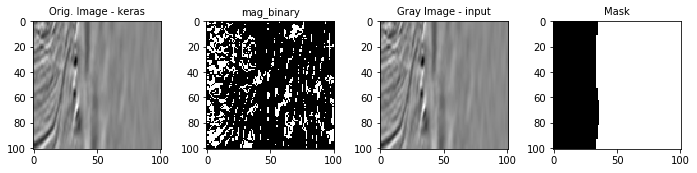

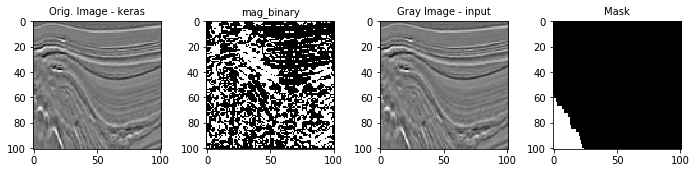

...

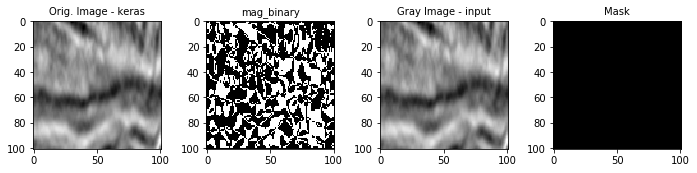

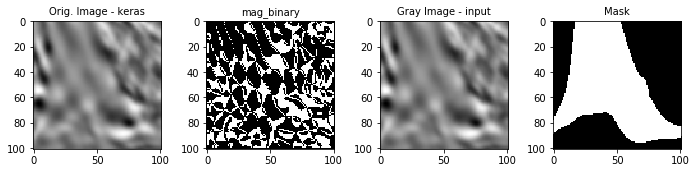

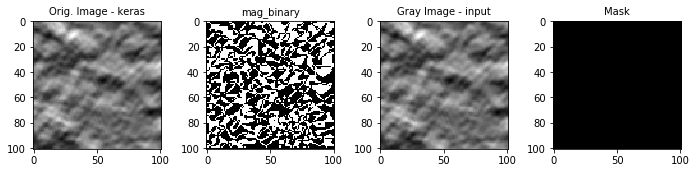

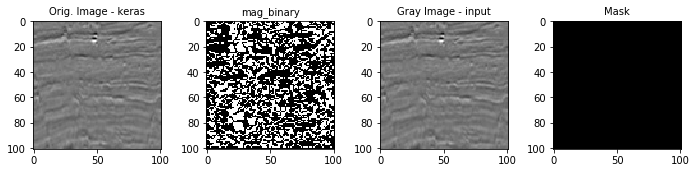

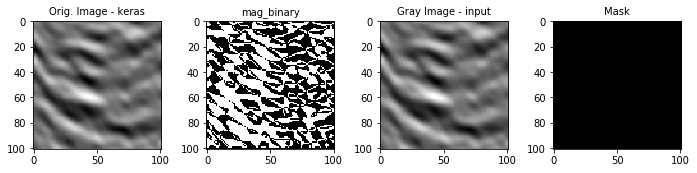

In [11]:
# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output


for _id in ids:
    image_gray = np.array(load_img(path_train_images+_id+".png",grayscale=True))/255
    mask = load_img(path_train_masks+_id+".png",grayscale=True)
    image_keras = load_img(path_train_images+_id+".png")
    #image_matplotlib = imread(path_train_images+_id+".png")
    mag_binary = dir_threshold(np.array(image_keras), sobel_kernel=15, thresh=(0.7, 1.3))
    
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(image_keras)
    ax1.set_title('Orig. Image - keras', fontsize=10)
    ax2.imshow(mag_binary, cmap='gray')
    ax2.set_title('mag_binary', fontsize=10)
    ax3.imshow(image_gray , cmap='gray')
    ax3.set_title('Gray Image - input', fontsize=10)
    ax4.imshow(mask , cmap='gray')
    ax4.set_title('Mask', fontsize=10)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


In [18]:
mag_binary.shape

(101, 101)

### filtered

/Users/gino/miniconda3/lib/python3.6/site-packages/keras_preprocessing/image.py:489: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn('grayscale is deprecated. Please use '
/Users/gino/miniconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


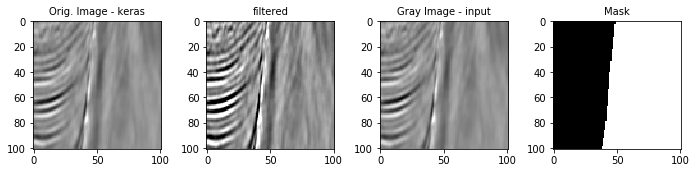

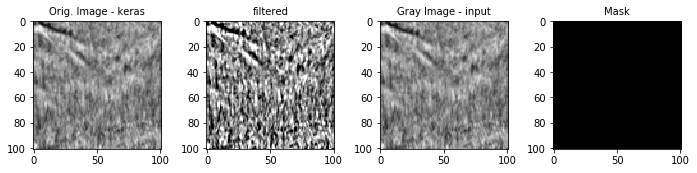

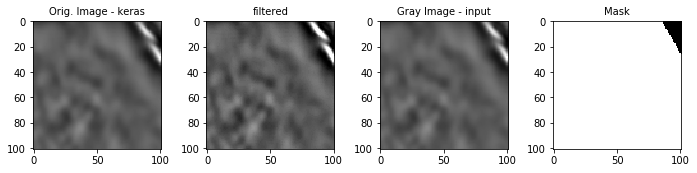

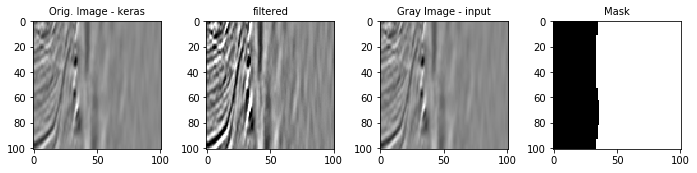

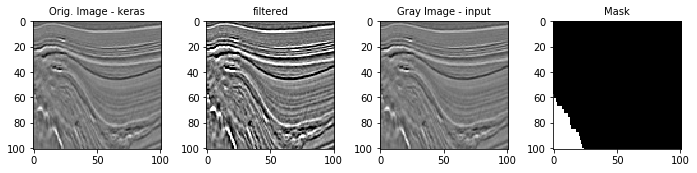

...

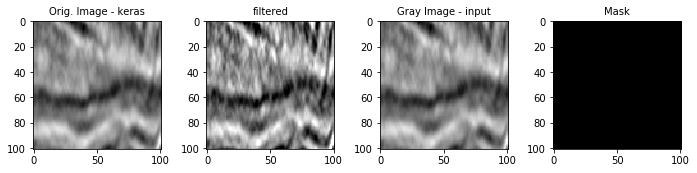

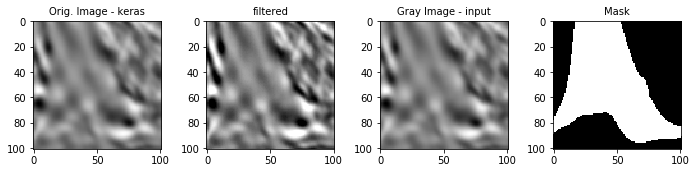

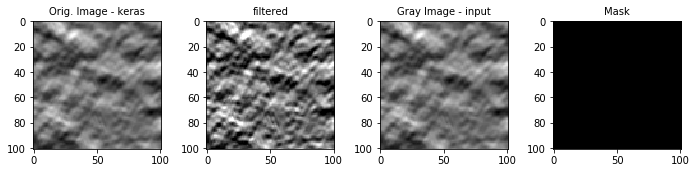

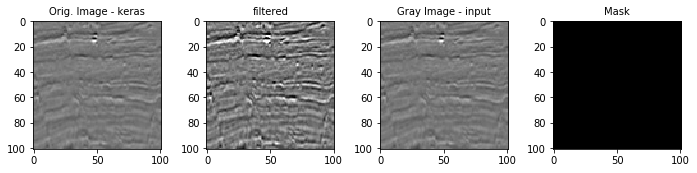

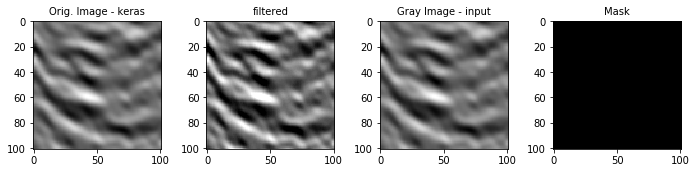

In [12]:
KSIZE = 11
ALPHA = 2

kernel = cv2.getGaussianKernel(KSIZE, 0)
kernel = -ALPHA * kernel @ kernel.T
kernel[KSIZE//2, KSIZE//2] += 1 + ALPHA


for _id in ids:
    image_gray = np.array(load_img(path_train_images+_id+".png",grayscale=True))/255
    mask = load_img(path_train_masks+_id+".png",grayscale=True)
    image_keras = load_img(path_train_images+_id+".png")
    #image_matplotlib = imread(path_train_images+_id+".png")
    filtered = cv2.filter2D(np.array(image_keras), -1, kernel)
    
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(image_keras)
    ax1.set_title('Orig. Image - keras', fontsize=10)
    ax2.imshow(filtered, cmap='gray')
    ax2.set_title('filtered', fontsize=10)
    ax3.imshow(image_gray , cmap='gray')
    ax3.set_title('Gray Image - input', fontsize=10)
    ax4.imshow(mask , cmap='gray')
    ax4.set_title('Mask', fontsize=10)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### fft

/Users/gino/miniconda3/lib/python3.6/site-packages/keras_preprocessing/image.py:489: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn('grayscale is deprecated. Please use '
/Users/gino/miniconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


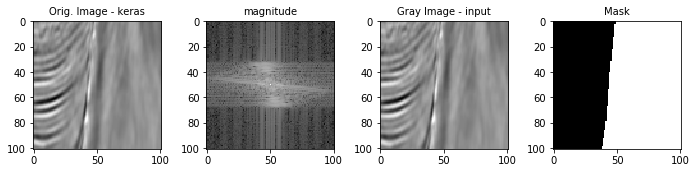

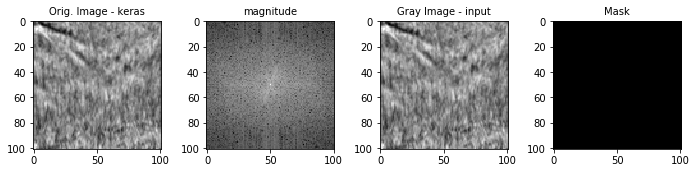

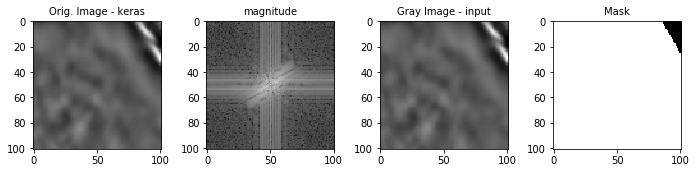

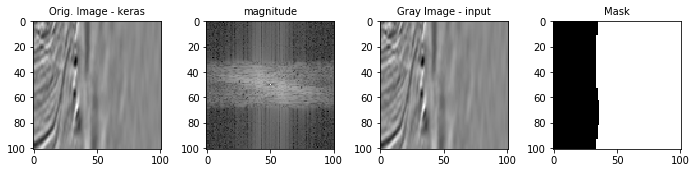

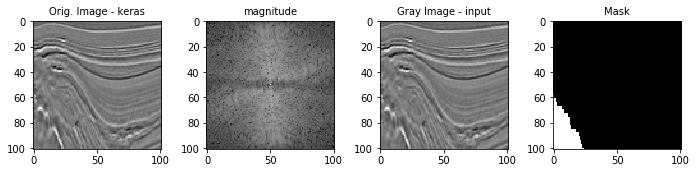

...

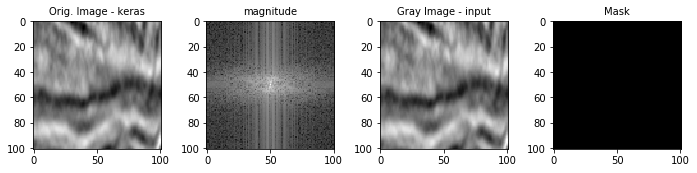

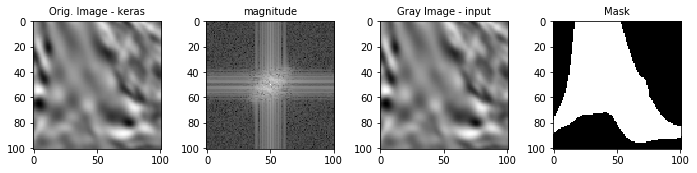

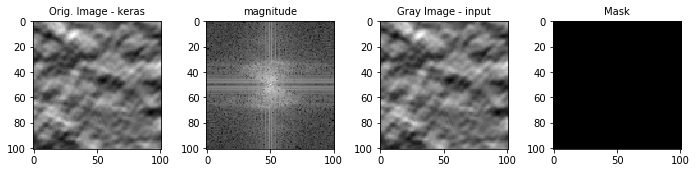

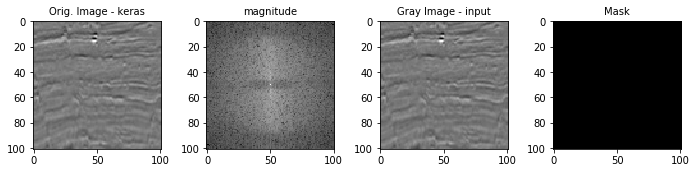

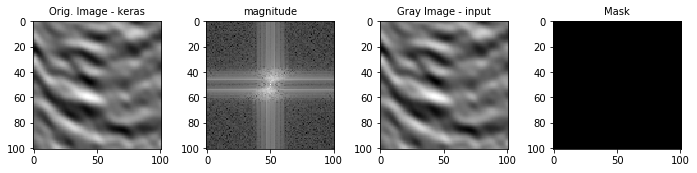

In [13]:
for _id in ids:
    image_gray = np.array(load_img(path_train_images+_id+".png",grayscale=True))/255
    mask = load_img(path_train_masks+_id+".png",grayscale=True)
    image_keras = load_img(path_train_images+_id+".png")
    #image_matplotlib = imread(path_train_images+_id+".png")
    fft = cv2.dft(cv2.imread(path_train_images+_id+".png", 0).astype(np.float32) / 255, flags=cv2.DFT_COMPLEX_OUTPUT)
    shifted = np.fft.fftshift(fft, axes=[0, 1])
    magnitude = cv2.magnitude(shifted[:, :, 0], shifted[:, :, 1])
    magnitude = np.log(magnitude)

    
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(image_keras)
    ax1.set_title('Orig. Image - keras', fontsize=10)
    ax2.imshow(magnitude, cmap='gray')
    ax2.set_title('magnitude', fontsize=10)
    ax3.imshow(image_gray , cmap='gray')
    ax3.set_title('Gray Image - input', fontsize=10)
    ax4.imshow(mask , cmap='gray')
    ax4.set_title('Mask', fontsize=10)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    

### fft filtered

/Users/gino/miniconda3/lib/python3.6/site-packages/keras_preprocessing/image.py:489: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn('grayscale is deprecated. Please use '
/Users/gino/miniconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


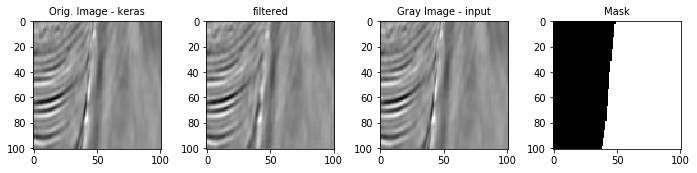

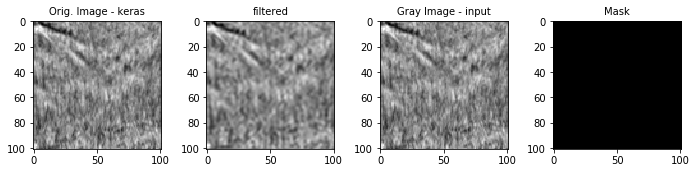

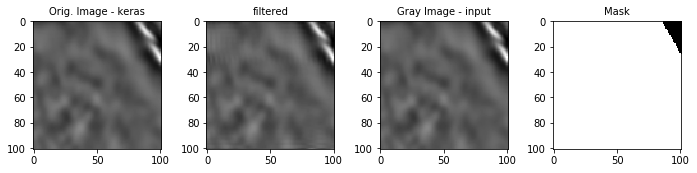

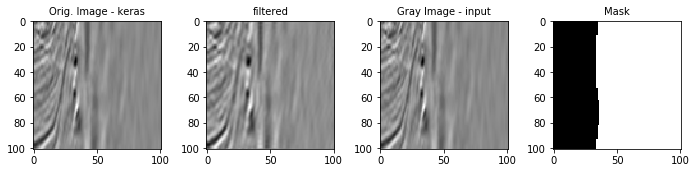

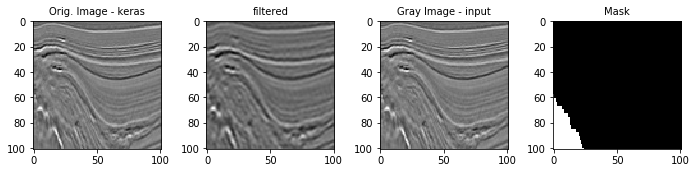

...

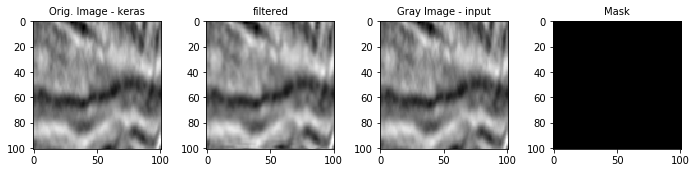

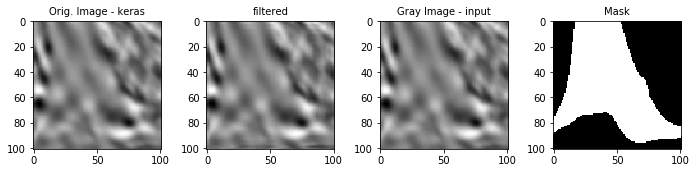

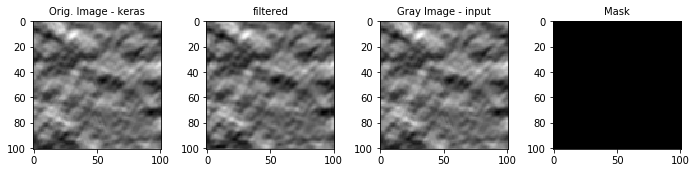

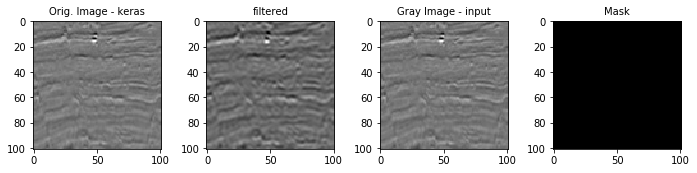

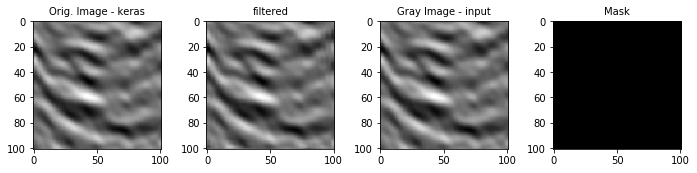

In [14]:
for _id in ids:
    image_gray = np.array(load_img(path_train_images+_id+".png",grayscale=True))/255
    mask0 = load_img(path_train_masks+_id+".png",grayscale=True)
    image_keras = load_img(path_train_images+_id+".png")
    #image_matplotlib = imread(path_train_images+_id+".png")
    fft = cv2.dft(cv2.imread(path_train_images+_id+".png", 0).astype(np.float32) / 255, flags=cv2.DFT_COMPLEX_OUTPUT)
    fft_shift = np.fft.fftshift(fft, axes=[0, 1])
    sz = 25
    mask = np.zeros(fft_shift.shape, np.uint8)
    mask[mask.shape[0]//2-sz:mask.shape[0]//2+sz,
         mask.shape[1]//2-sz:mask.shape[1]//2+sz, :] = 1
    fft_shift *= mask
    fft = np.fft.ifftshift(fft_shift, axes=[0, 1])
    filtered = cv2.idft(fft, flags=cv2.DFT_SCALE | cv2.DFT_REAL_OUTPUT)

    
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(image_keras)
    ax1.set_title('Orig. Image - keras', fontsize=10)
    ax2.imshow(filtered, cmap='gray')
    ax2.set_title('filtered', fontsize=10)
    ax3.imshow(image_gray , cmap='gray')
    ax3.set_title('Gray Image - input', fontsize=10)
    ax4.imshow(mask0 , cmap='gray')
    ax4.set_title('Mask', fontsize=10)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### adapt_mask

/Users/gino/miniconda3/lib/python3.6/site-packages/keras_preprocessing/image.py:489: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn('grayscale is deprecated. Please use '


***** 0530b67189
[[   0 8102]
 [ 255 2099]]
***** 1306fcee4c
[[   0 6739]
 [ 255 3462]]
***** 158765ed16
[[   0 9552]
 [ 255  649]]
***** 16207869ba
[[   0 8293]
 [ 255 1908]]
***** 30082e87d9
[[   0 7447]
 [ 255 2754]]
***** 44d745a704
[[   0 7753]
 [ 255 2448]]
***** 48d81e93d9
[[   0 8321]
 [ 255 1880]]
***** 633c7d5c80
[[   0 7020]
 [ 255 3181]]
***** 711c478c93
[[   0 7701]
 [ 255 2500]]
***** 7e7276d088
[[   0 8881]
 [ 255 1320]]
***** 8329ec9395
[[   0 9102]
 [ 255 1099]]
***** 84e23dba29
[[   0 7001]
 [ 255 3200]]
***** 917ef84e64
[[   0 6682]
 [ 255 3519]]
***** 919bc0e2ba
[[   0 6642]
 [ 255 3559]]
***** 9cbd5ddba4
[[   0 6763]
 [ 255 3438]]
***** a7cfa30d35
[[   0 7132]
 [ 255 3069]]
***** ac931ace49
[[   0 7211]
 [ 255 2990]]
***** c7f54785b8
[[   0 6898]
 [ 255 3303]]
***** caa039b231
[[   0 8466]
 [ 255 1735]]
***** cb36193e2f
[[   0 9582]
 [ 255  619]]


/Users/gino/miniconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


***** e73532b450
[[   0 7580]
 [ 255 2621]]
***** e8d8b35601
[[   0 7519]
 [ 255 2682]]
***** edf1e6ac00
[[   0 6950]
 [ 255 3251]]
***** f139be21a4
[[   0 8305]
 [ 255 1896]]
***** fb44090bc7
[[   0 7134]
 [ 255 3067]]


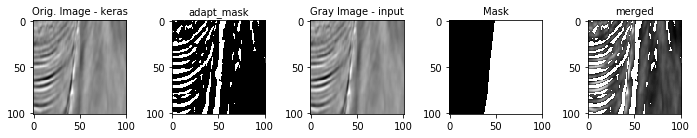

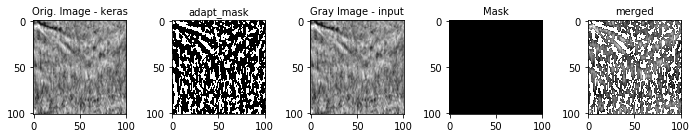

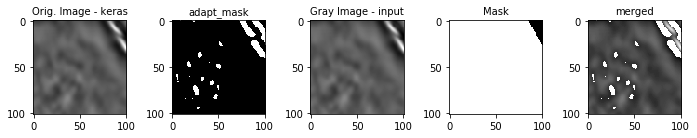

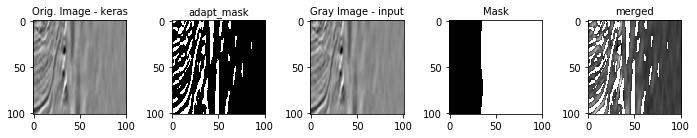

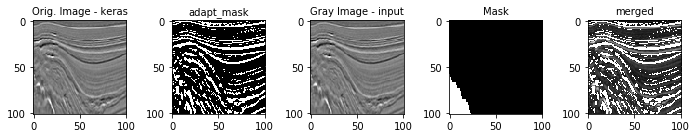

...

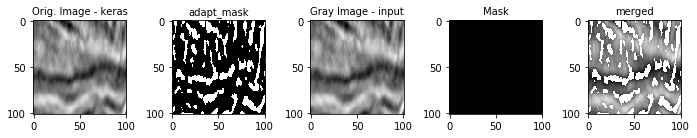

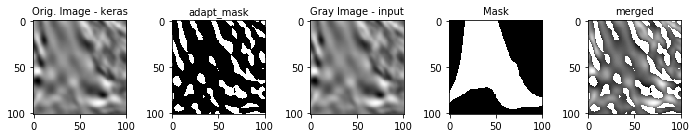

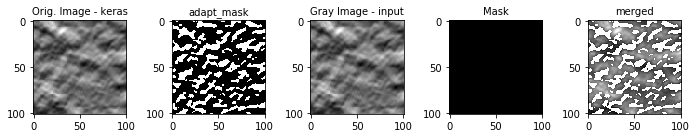

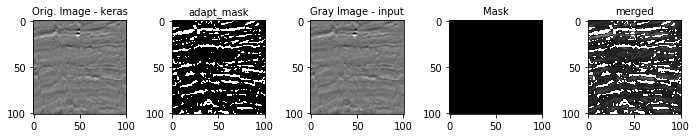

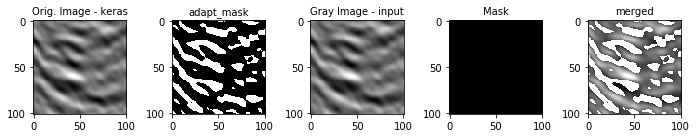

In [15]:
from scipy.stats import itemfreq
for _id in ids:
    image_gray = np.array(load_img(path_train_images+_id+".png",grayscale=True))
    mask0 = load_img(path_train_masks+_id+".png",grayscale=True)
    image_keras = load_img(path_train_images+_id+".png")
    #image_matplotlib = imread(path_train_images+_id+".png")
    adapt_mask = cv2.adaptiveThreshold(cv2.imread(path_train_images+_id+".png", 0), 255, cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY_INV, 11, 10)
    merged = np.maximum(adapt_mask,np.array(image_gray))/255
    
    f, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(image_keras)
    ax1.set_title('Orig. Image - keras', fontsize=10)
    ax2.imshow(adapt_mask, cmap='gray')
    ax2.set_title('adapt_mask', fontsize=10)
    print("*****",_id)
    print(itemfreq(adapt_mask.flatten()))
    ax3.imshow(image_gray , cmap='gray')
    ax3.set_title('Gray Image - input', fontsize=10)
    ax4.imshow(mask0 , cmap='gray')
    ax4.set_title('Mask', fontsize=10)
    ax5.imshow(merged , cmap='gray')
    ax5.set_title('merged', fontsize=10)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Morphological operators

/Users/gino/miniconda3/lib/python3.6/site-packages/keras_preprocessing/image.py:489: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn('grayscale is deprecated. Please use '
/Users/gino/miniconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


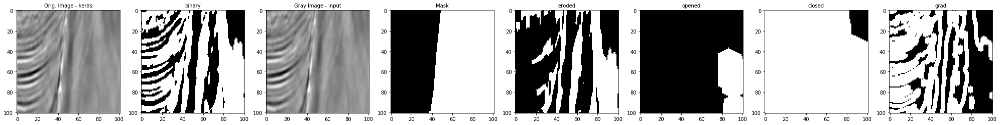

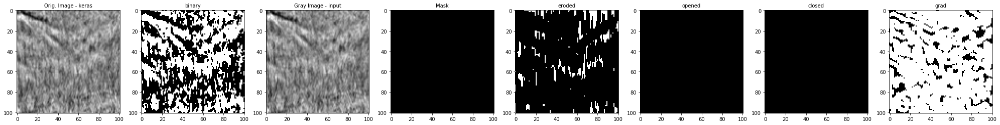

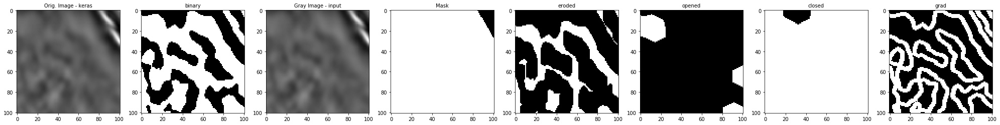

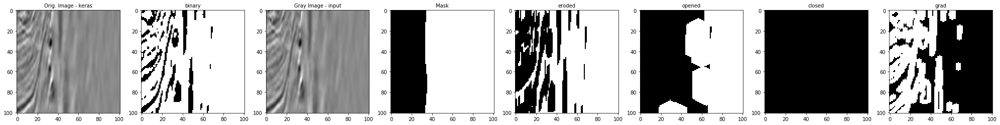

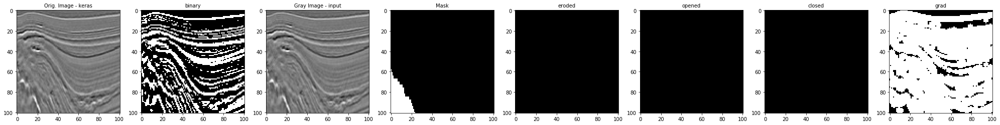

...

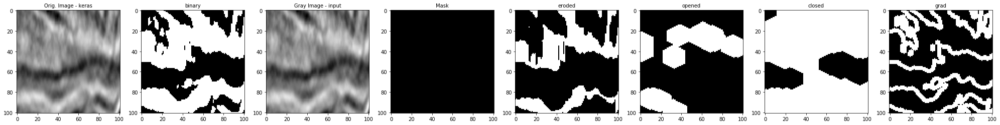

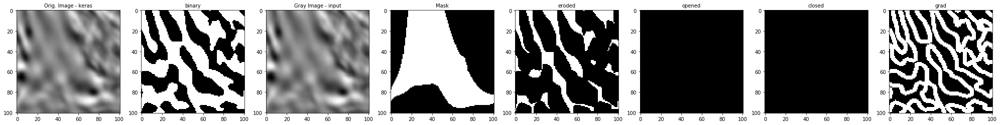

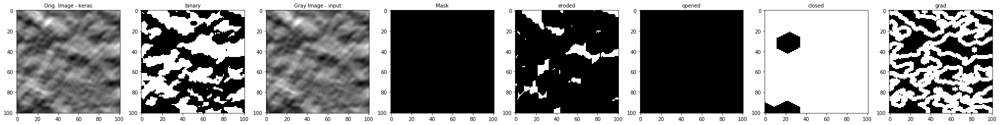

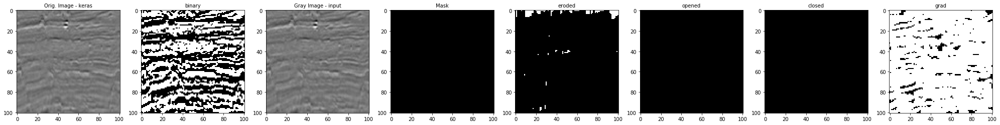

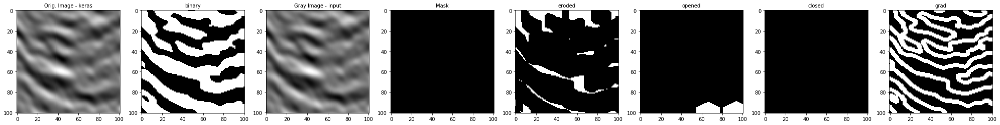

In [16]:
def rle_encode(im):
    '''
    im: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    pixels = im.flatten(order = 'F')
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)


from scipy.stats import itemfreq
for _id in ids:
    image_gray = np.array(load_img(path_train_images+_id+".png",grayscale=True))
    mask0 = load_img(path_train_masks+_id+".png",grayscale=True)
    image_keras = load_img(path_train_images+_id+".png")
    #image_matplotlib = imread(path_train_images+_id+".png")
    
    image = cv2.imread(path_train_images+_id+".png", 0)
    _, binary = cv2.threshold(image, -1, 1, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    #print("*******************",_id)
    #print(rle_encode(binary))
    eroded = cv2.morphologyEx(binary, cv2.MORPH_ERODE, (3, 3), iterations=10)
    dilated = cv2.morphologyEx(binary, cv2.MORPH_DILATE, (3, 3), iterations=10)
    opened = cv2.morphologyEx(binary, cv2.MORPH_OPEN,
                          cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5)),
                          iterations=5)
    closed = cv2.morphologyEx(binary, cv2.MORPH_CLOSE,
                          cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5)),
                          iterations=5)
    grad = cv2.morphologyEx(binary, cv2.MORPH_GRADIENT,
                          cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5)))
    
    
    f, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8) = plt.subplots(1, 8, figsize=(27, 18))
    f.tight_layout()
    ax1.imshow(image_keras)
    ax1.set_title('Orig. Image - keras', fontsize=10)
    ax2.imshow(binary, cmap='gray')
    ax2.set_title('binary', fontsize=10)
    ax3.imshow(image_gray , cmap='gray')
    ax3.set_title('Gray Image - input', fontsize=10)
    ax4.imshow(mask0 , cmap='gray')
    ax4.set_title('Mask', fontsize=10)
    ax5.imshow(eroded , cmap='gray')
    ax5.set_title('eroded', fontsize=10)
    ax6.imshow(opened , cmap='gray')
    ax6.set_title('opened', fontsize=10)
    ax7.imshow(closed , cmap='gray')
    ax7.set_title('closed', fontsize=10)
    ax8.imshow(grad , cmap='gray')
    ax8.set_title('grad', fontsize=10)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)